In [1]:
%cd '~/Documents/berkeley/SavageLab/scripts/tecantaloupe_distro/'

/Users/jackdesmarais/Documents/berkeley/SavageLab/scripts/tecantaloupe_distro


In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn
import itertools

from growth.plate_spec import PlateSpec
from growth.plate_time_course_parser import SavageLabM1000Excel
from matplotlib import pyplot as plt

In [7]:
pd.read_csv('growth/plate_specs/2020_03_05_FolA_library_QC.csv', header=[0,1], index_col=[0]).shape

(8, 12)

In [9]:
pd.read_csv('growth/plate_specs/2020_03_05_FolA_library_QC.csv', header=[0,1], index_col=[0])

value_type                             name                                   \
column                                    1                                2   
A           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
B           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
C           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
D           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
E              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
F              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
G              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   
H              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   

value_type                                                                    \
column                                    3                                4   
A           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
B           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
C           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
D           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
E              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
F              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
G              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   
H              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   

value_type                                                                    \
column                                    5                                6   
A           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
B           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
C           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
D           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
E              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
F              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
G              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   
H              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   

value_type                                                                    \
column                                    7                                8   
A           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
B           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
C           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
D           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
E              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
F              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
G              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   
H              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   

value_type                                                                     \
column                                    9                                10   
A           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
B           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
C           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
D           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
E              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
F              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
G              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon_1E6Lib_10   
H              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon

In [11]:
plate = """Ade+Glucose+0	Ade+Glucose+1	Ade+Glucose+5	Ade+Glucose+10	Ade+Glucose+50	Ade+Glucose+100	Ade+Glucose+500	Ade+Glucose+1000
Ade+Glucose+0	Ade+Glucose+1	Ade+Glucose+5	Ade+Glucose+10	Ade+Glucose+50	Ade+Glucose+100	Ade+Glucose+500	Ade+Glucose+1000
Ade+Glucose+0	Ade+Glucose+1	Ade+Glucose+5	Ade+Glucose+10	Ade+Glucose+50	Ade+Glucose+100	Ade+Glucose+500	Ade+Glucose+1000
trp+Glucose+0	trp+Glucose+1	trp+Glucose+5	trp+Glucose+10	trp+Glucose+50	trp+Glucose+100	trp+Glucose+500	trp+Glucose+1000
trp+Glucose+0	trp+Glucose+1	trp+Glucose+5	trp+Glucose+10	trp+Glucose+50	trp+Glucose+100	trp+Glucose+500	trp+Glucose+1000
trp+Glucose+0	trp+Glucose+1	trp+Glucose+5	trp+Glucose+10	trp+Glucose+50	trp+Glucose+100	trp+Glucose+500	trp+Glucose+1000
Ade+Galactose+0	Ade+Galactose+1	Ade+Galactose+5	Ade+Galactose+10	Ade+Galactose+50	Ade+Galactose+100	Ade+Galactose+500	Ade+Galactose+1000
Ade+Galactose+0	Ade+Galactose+1	Ade+Galactose+5	Ade+Galactose+10	Ade+Galactose+50	Ade+Galactose+100	Ade+Galactose+500	Ade+Galactose+1000
Ade+Galactose+0	Ade+Galactose+1	Ade+Galactose+5	Ade+Galactose+10	Ade+Galactose+50	Ade+Galactose+100	Ade+Galactose+500	Ade+Galactose+1000
trp+Galactose+0	trp+Galactose+1	trp+Galactose+5	trp+Galactose+10	trp+Galactose+50	trp+Galactose+100	trp+Galactose+500	trp+Galactose+1000
trp+Galactose+0	trp+Galactose+1	trp+Galactose+5	trp+Galactose+10	trp+Galactose+50	trp+Galactose+100	trp+Galactose+500	trp+Galactose+1000
trp+Galactose+0	trp+Galactose+1	trp+Galactose+5	trp+Galactose+10	trp+Galactose+50	trp+Galactose+100	trp+Galactose+500	trp+Galactose+1000"""
plate = np.array([row.split('	') for row in plate.split('\n')]).T
print(plate.shape)

# grab index from old plate
ps = PlateSpec.FromFile('growth/plate_specs/2020_03_05_FolA_library_QC.csv')
display(ps.df)
plate = pd.DataFrame(plate, columns=ps.df.columns, index=['abcdefgh'.upper()[i] for i in range(8)])
display(plate)

psloc = 'growth/plate_specs/2021_02_01_induction_test_yeast.csv'
plate.to_csv(psloc)

# PlateSpec defined in CSV for easy editing
ps = PlateSpec.FromFile(psloc)
name_mapping = ps.well_to_name_mapping()

# PlateSpec contains a DataFrame with the mapping. 
ps.df

(8, 12)


value_type                             name                                   \
column                                    1                                2   
A           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
B           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
C           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
D           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
E              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
F              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
G              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   
H              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   

value_type                                                                    \
column                                    3                                4   
A           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
B           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
C           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
D           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
E              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
F              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
G              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   
H              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   

value_type                                                                    \
column                                    5                                6   
A           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
B           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
C           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
D           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
E              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
F              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
G              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   
H              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   

value_type                                                                    \
column                                    7                                8   
A           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
B           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
C           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
D           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
E              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
F              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
G              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   
H              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   

value_type                                                                     \
column                                    9                                10   
A           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
B           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
C           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
D           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
E              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
F              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
G              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon_1E6Lib_10   
H              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon

value_type              name                                      \
column                     1                 2                 3   
A              Ade+Glucose+0     Ade+Glucose+0     Ade+Glucose+0   
B              Ade+Glucose+1     Ade+Glucose+1     Ade+Glucose+1   
C              Ade+Glucose+5     Ade+Glucose+5     Ade+Glucose+5   
D             Ade+Glucose+10    Ade+Glucose+10    Ade+Glucose+10   
E             Ade+Glucose+50    Ade+Glucose+50    Ade+Glucose+50   
F            Ade+Glucose+100   Ade+Glucose+100   Ade+Glucose+100   
G            Ade+Glucose+500   Ade+Glucose+500   Ade+Glucose+500   
H           Ade+Glucose+1000  Ade+Glucose+1000  Ade+Glucose+1000   

value_type                                                        \
column                     4                 5                 6   
A              trp+Glucose+0     trp+Glucose+0     trp+Glucose+0   
B              trp+Glucose+1     trp+Glucose+1     trp+Glucose+1   
C              trp+Glucose+5     trp+Glucose+5     trp+Glucose+5   
D             trp+Glucose+10    trp+Glucose+10    trp+Glucose+10   
E             trp+Glucose+50    trp+Glucose+50    trp+Glucose+50   
F            trp+Glucose+100   trp+Glucose+100   trp+Glucose+100   
G            trp+Glucose+500   trp+Glucose+500   trp+Glucose+500   
H           trp+Glucose+1000  trp+Glucose+1000  trp+Glucose+1000   

value_type                                                              \
column                       7                   8                   9   
A              Ade+Galactose+0     Ade+Galactose+0     Ade+Galactose+0   
B              Ade+Galactose+1     Ade+Galactose+1     Ade+Galactose+1   
C              Ade+Galactose+5     Ade+Galactose+5     Ade+Galactose+5   
D             Ade+Galactose+10    Ade+Galactose+10    Ade+Galactose+10   
E             Ade+Galactose+50    Ade+Galactose+50    Ade+Galactose+50   
F            Ade+Galactose+100   Ade+Galactose+100   Ade+Galactose+100   
G            Ade+Galactose+500   Ade+Galactose+500   Ade+Galactose+500   
H           Ade+Galactose+1000  Ade+Galactose+1000  Ade+Galactose+1000   

value_type                                                              
column                      10                  11                  12  
A              trp+Galactose+0     trp+Galactose+0     trp+Galactose+0  
B              trp+Galactose+1     trp+Galactose+1     trp+Galactose+1  
C              trp+Galactose+5     trp+Galactose+5     trp+Galactose+5  
D             trp+Galactose+10    trp+Galactose+10    trp+Galactose+10  
E             trp+Galactose+50    trp+Galactose+50    trp+Galactose+50  
F            trp+Galactose+100   trp+Galactose+100   trp+Galactose+100  
G            trp+Galactose+500   trp+Galactose+500   trp+Galactose+500  
H           trp+Galactose+1000  trp+Galactose+1000  trp+Galactose+1000

value_type              name                                      \
column                     1                 2                 3   
A              Ade+Glucose+0     Ade+Glucose+0     Ade+Glucose+0   
B              Ade+Glucose+1     Ade+Glucose+1     Ade+Glucose+1   
C              Ade+Glucose+5     Ade+Glucose+5     Ade+Glucose+5   
D             Ade+Glucose+10    Ade+Glucose+10    Ade+Glucose+10   
E             Ade+Glucose+50    Ade+Glucose+50    Ade+Glucose+50   
F            Ade+Glucose+100   Ade+Glucose+100   Ade+Glucose+100   
G            Ade+Glucose+500   Ade+Glucose+500   Ade+Glucose+500   
H           Ade+Glucose+1000  Ade+Glucose+1000  Ade+Glucose+1000   

value_type                                                        \
column                     4                 5                 6   
A              trp+Glucose+0     trp+Glucose+0     trp+Glucose+0   
B              trp+Glucose+1     trp+Glucose+1     trp+Glucose+1   
C              trp+Glucose+5     trp+Glucose+5     trp+Glucose+5   
D             trp+Glucose+10    trp+Glucose+10    trp+Glucose+10   
E             trp+Glucose+50    trp+Glucose+50    trp+Glucose+50   
F            trp+Glucose+100   trp+Glucose+100   trp+Glucose+100   
G            trp+Glucose+500   trp+Glucose+500   trp+Glucose+500   
H           trp+Glucose+1000  trp+Glucose+1000  trp+Glucose+1000   

value_type                                                              \
column                       7                   8                   9   
A              Ade+Galactose+0     Ade+Galactose+0     Ade+Galactose+0   
B              Ade+Galactose+1     Ade+Galactose+1     Ade+Galactose+1   
C              Ade+Galactose+5     Ade+Galactose+5     Ade+Galactose+5   
D             Ade+Galactose+10    Ade+Galactose+10    Ade+Galactose+10   
E             Ade+Galactose+50    Ade+Galactose+50    Ade+Galactose+50   
F            Ade+Galactose+100   Ade+Galactose+100   Ade+Galactose+100   
G            Ade+Galactose+500   Ade+Galactose+500   Ade+Galactose+500   
H           Ade+Galactose+1000  Ade+Galactose+1000  Ade+Galactose+1000   

value_type                                                              
column                      10                  11                  12  
A              trp+Galactose+0     trp+Galactose+0     trp+Galactose+0  
B              trp+Galactose+1     trp+Galactose+1     trp+Galactose+1  
C              trp+Galactose+5     trp+Galactose+5     trp+Galactose+5  
D             trp+Galactose+10    trp+Galactose+10    trp+Galactose+10  
E             trp+Galactose+50    trp+Galactose+50    trp+Galactose+50  
F            trp+Galactose+100   trp+Galactose+100   trp+Galactose+100  
G            trp+Galactose+500   trp+Galactose+500   trp+Galactose+500  
H           trp+Galactose+1000  trp+Galactose+1000  trp+Galactose+1000

In [31]:
parser = SavageLabM1000Excel()
timecourse = parser.ParseFromFilename('growth/data/2021_02_01_cas9_variants_yeast.xlsx')

blanked = timecourse.blank()
# You can blank each well against it's own early timepoints
# by not setting blank_wells

# Smooth with default params.
smoothed = blanked.smooth()

['abs600', 'mCherry', 'sfGFP']


<Figure size 720x720 with 0 Axes>

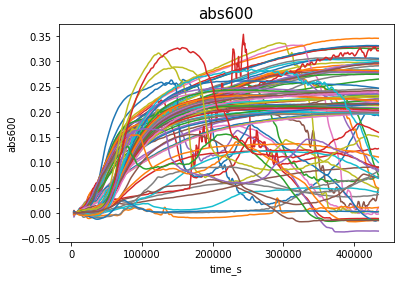

<Figure size 720x720 with 0 Axes>

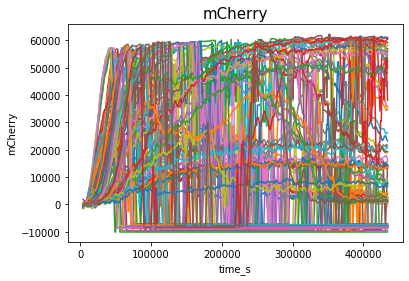

<Figure size 720x720 with 0 Axes>

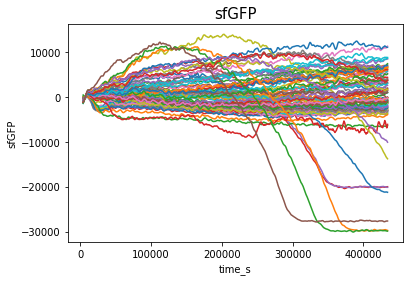

In [32]:
# Smoothed & blanked data.
print(timecourse.labels())
for label in timecourse.labels():
    fig = plt.figure(figsize=(10,10))
    OD_data = smoothed.data_for_label(label)
    OD_data.plot(x='time_s', legend=False)
    plt.ylabel(label)
    plt.title(label, fontsize=15)
    plt.show()


In [33]:
OD_data = smoothed.data_for_label('mCherry')
display(OD_data)
max(OD_data.drop('time_s',axis=1).max())

well,time_s,A1,B1,C1,D1,E1,F1,G1,H1,A2,...,G11,H11,A12,B12,C12,D12,E12,F12,G12,H12
cycle_n,,,,,,,,,,,,,,,,,,,,,
5,3913.2,52.333333,-35.955556,-92.311111,-1027.111111,40.955556,-230.688889,-739.533333,-1149.666667,-567.022222,...,98.533333,-608.000000,-1358.466667,-92.888889,-379.022222,-90.822222,-1265.666667,-200.355556,-799.844444,-105.888889
6,4891.6,247.666667,-443.955556,-242.644444,-775.444444,-247.377778,-137.244444,-554.866667,-973.222222,51.866667,...,34.866667,-273.777778,-994.577778,128.888889,-312.911111,-102.155556,-599.333333,-14.355556,-525.066667,-99.333333
7,5869.9,184.777778,-535.288889,-176.866667,-302.222222,-33.044444,-39.355556,-284.533333,-718.555556,46.755556,...,-182.355556,-283.444444,-547.911111,241.111111,-54.466667,-296.600000,127.777778,-27.022222,-126.177778,-167.444444
8,6848.2,111.777778,-189.400000,117.355556,222.000000,262.844444,7.755556,83.688889,-165.888889,-199.466667,...,-1.466667,-142.555556,-39.577778,72.555556,263.977778,-443.822222,432.333333,44.422222,97.488889,-40.555556
9,7826.5,35.888889,607.044444,437.688889,589.111111,694.733333,272.977778,564.022222,558.555556,-559.911111,...,297.755556,-278.222222,488.088889,18.666667,172.088889,-127.711111,33.888889,221.644444,300.600000,127.555556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,430443.6,2677.666667,1397.711111,8163.133333,1121.000000,1393.177778,57599.200000,-8685.200000,52347.111111,751.200000,...,-8217.800000,-7785.000000,8194.311111,8181.444444,6409.422222,2167.400000,1438.777778,45941.422222,-7894.400000,1844.333333
442,431421.8,3154.111111,1402.377778,7464.022222,1171.444444,867.733333,56985.977778,-8685.200000,51481.444444,682.644444,...,-8217.800000,-7785.000000,8569.977778,8278.333333,7171.311111,2028.844444,1503.888889,53616.311111,-7894.400000,1863.222222
443,432400.1,3061.000000,899.044444,6673.577778,1466.666667,327.066667,56710.644444,-8685.200000,50820.888889,89.755556,...,-8217.800000,-7785.000000,8764.755556,8101.444444,7748.644444,2014.066667,1287.000000,53547.200000,-7894.400000,1748.666667


62245.62222222221

['abs600', 'mCherry', 'sfGFP']


<Figure size 720x720 with 0 Axes>

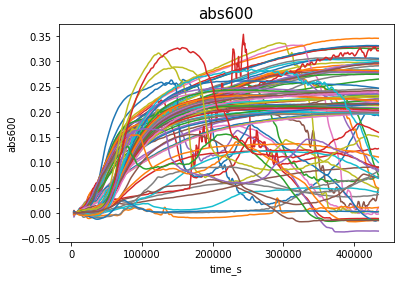

<Figure size 720x720 with 0 Axes>

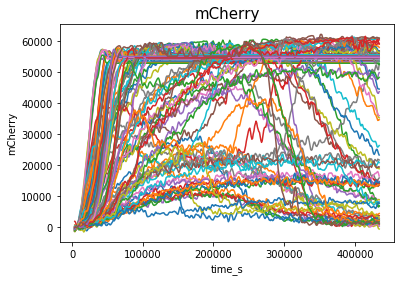

<Figure size 720x720 with 0 Axes>

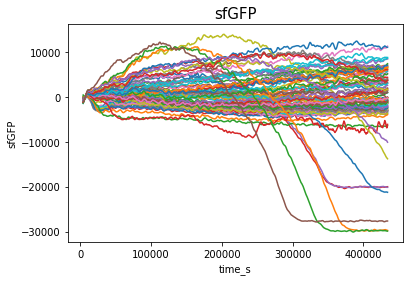

In [34]:
parser = SavageLabM1000Excel(overflow=63000)
timecourse = parser.ParseFromFilename('growth/data/2021_02_01_cas9_variants_yeast.xlsx')

blanked = timecourse.blank()
# You can blank each well against it's own early timepoints
# by not setting blank_wells

# Smooth with default params.
smoothed = blanked.smooth()

# Smoothed & blanked data.
print(timecourse.labels())
for label in timecourse.labels():
    fig = plt.figure(figsize=(10,10))
    OD_data = smoothed.data_for_label(label)
    OD_data.plot(x='time_s', legend=False)
    plt.ylabel(label)
    plt.title(label, fontsize=15)
    plt.show()

In [37]:
mean_OD.columns

Index(['Ade+Galactose+0', 'Ade+Galactose+1', 'Ade+Galactose+10',
       'Ade+Galactose+100', 'Ade+Galactose+1000', 'Ade+Galactose+5',
       'Ade+Galactose+50', 'Ade+Galactose+500', 'Ade+Glucose+0',
       'Ade+Glucose+1', 'Ade+Glucose+10', 'Ade+Glucose+100',
       'Ade+Glucose+1000', 'Ade+Glucose+5', 'Ade+Glucose+50',
       'Ade+Glucose+500', 'trp+Galactose+0', 'trp+Galactose+1',
       'trp+Galactose+10', 'trp+Galactose+100', 'trp+Galactose+1000',
       'trp+Galactose+5', 'trp+Galactose+50', 'trp+Galactose+500',
       'trp+Glucose+0', 'trp+Glucose+1', 'trp+Glucose+10', 'trp+Glucose+100',
       'trp+Glucose+1000', 'trp+Glucose+5', 'trp+Glucose+50',
       'trp+Glucose+500', 'time_s'],
      dtype='object', name='label')

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


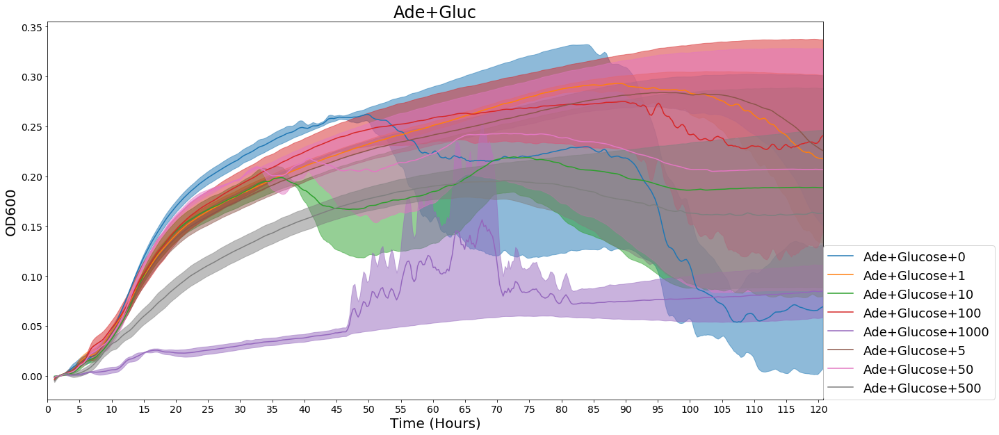

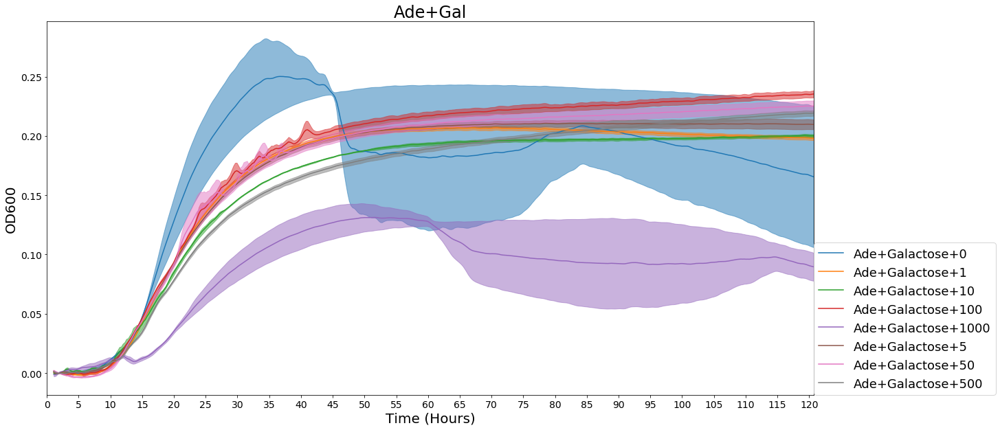

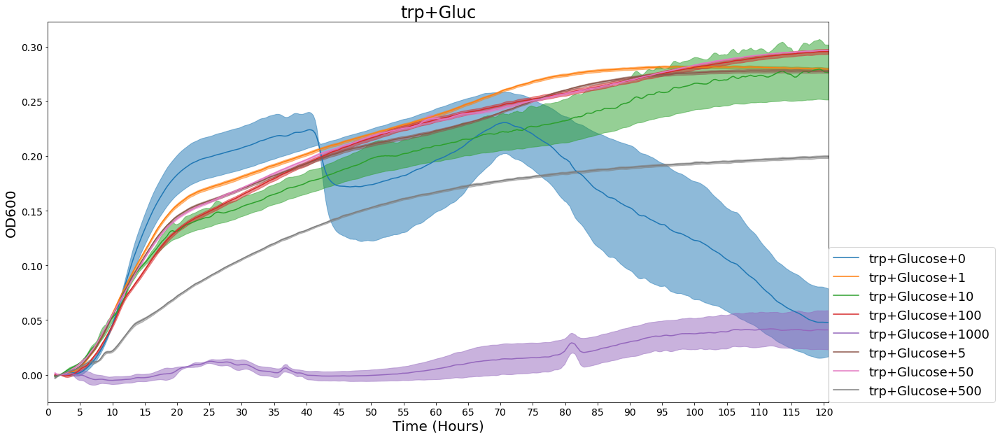

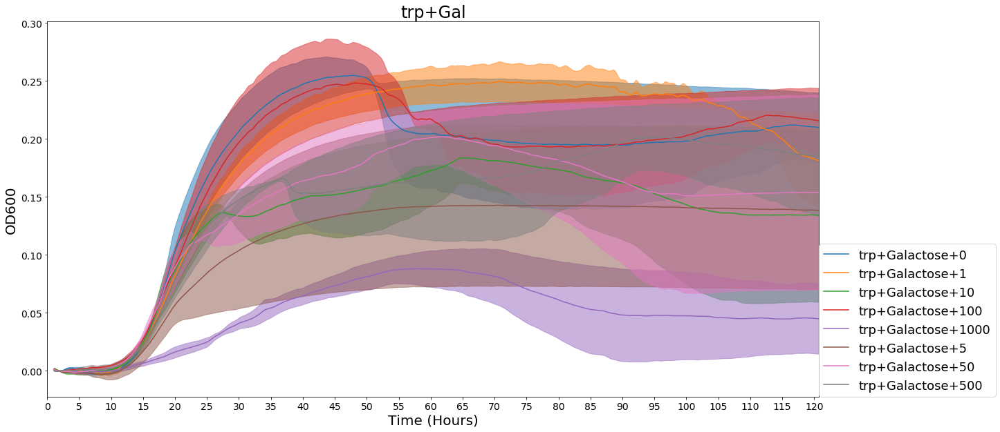

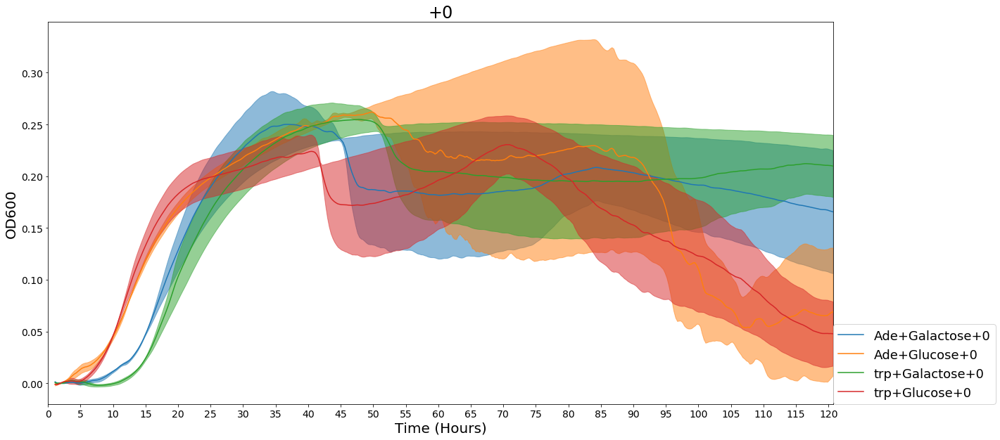

...

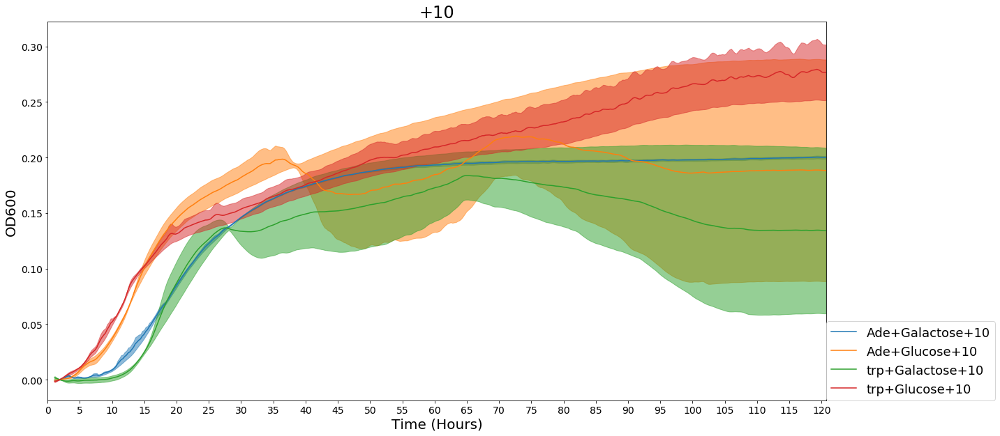

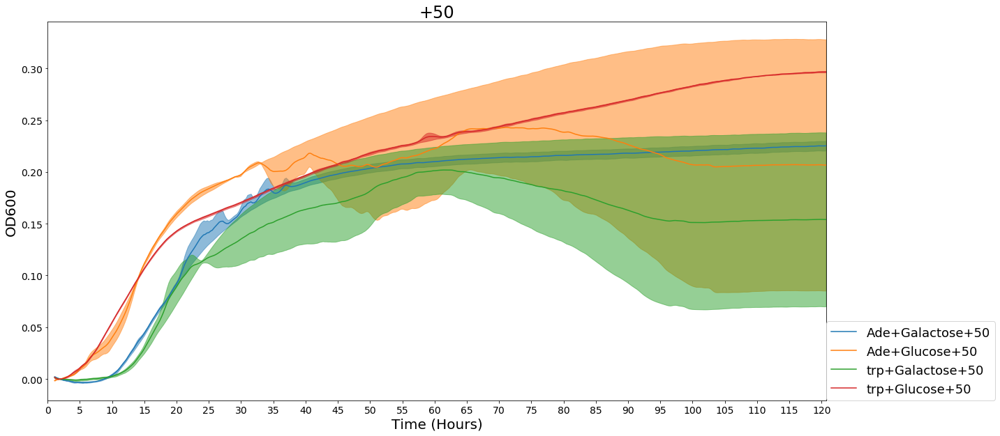

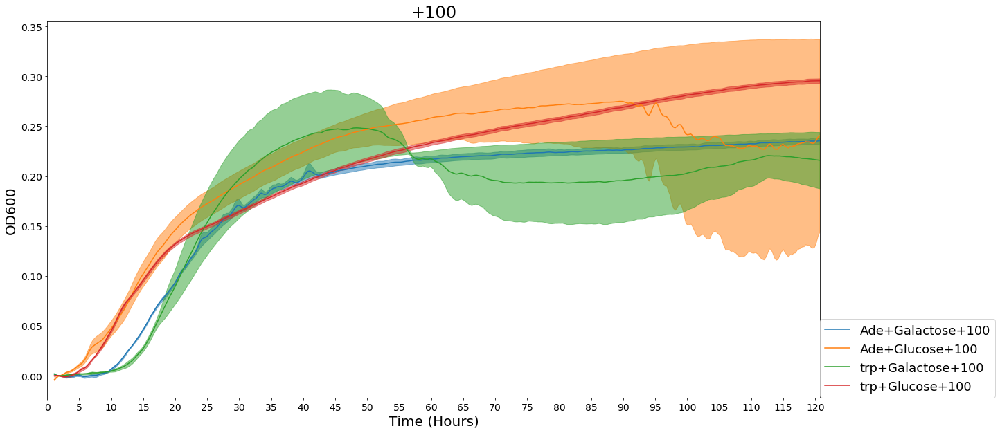

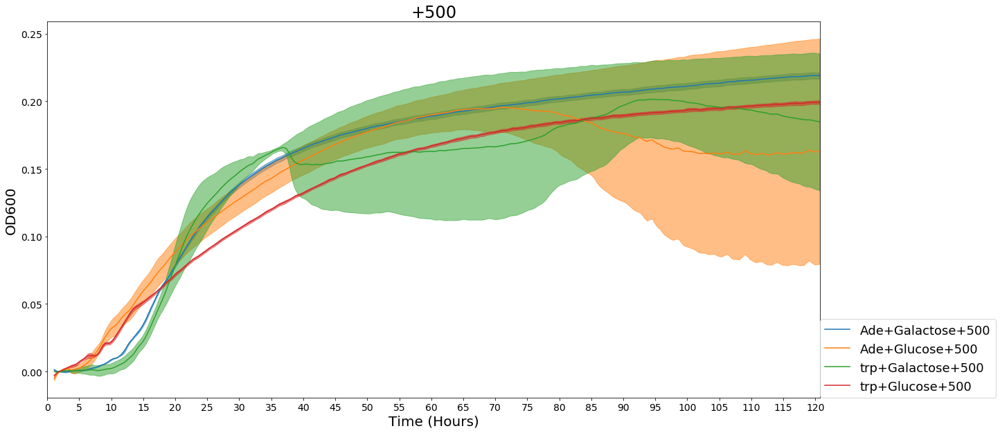

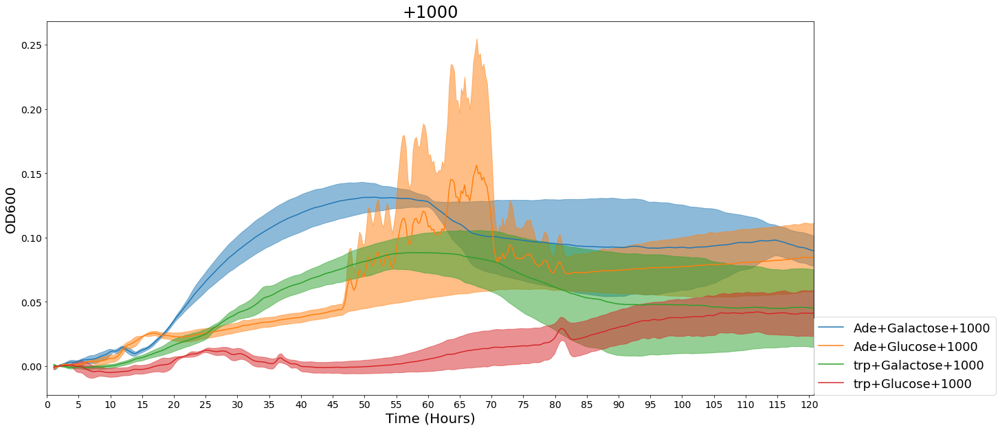

In [42]:
# figure outr what;s going on with means

means = smoothed.mean_by_name(ps)
sems = smoothed.sem_by_name(ps)

mean_OD = means.data_for_label('abs600')
sems_OD = sems.data_for_label('abs600')

# groupings of samples for plotting
samples = ['Ade+Gluc','Ade+Gal','trp+Gluc','trp+Gal']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('OD600', fontsize=20)

plt.show()

# groupings of samples for plotting
samples = ['+0','+1','+5','+10','+50','+100','+500','+1000']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('OD600', fontsize=20)

plt.show()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


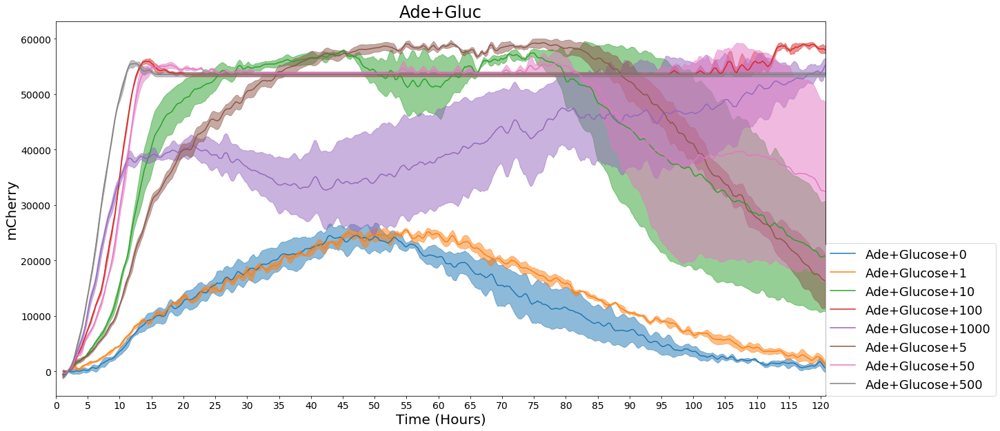

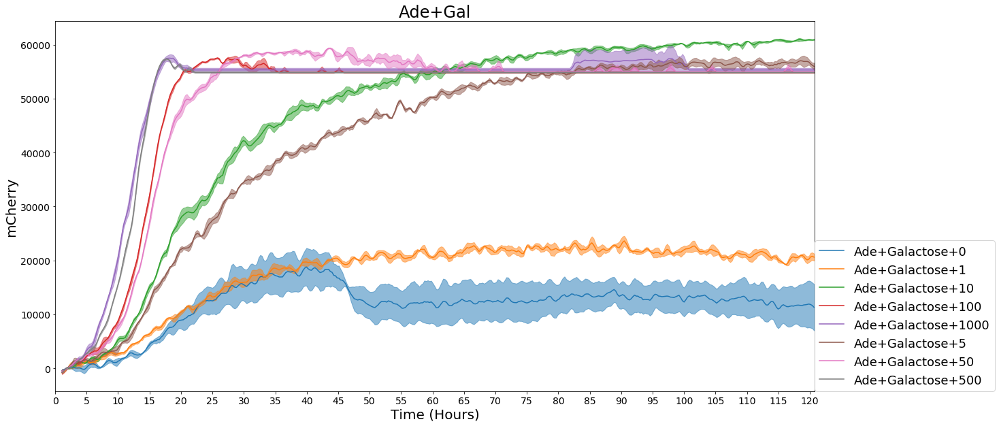

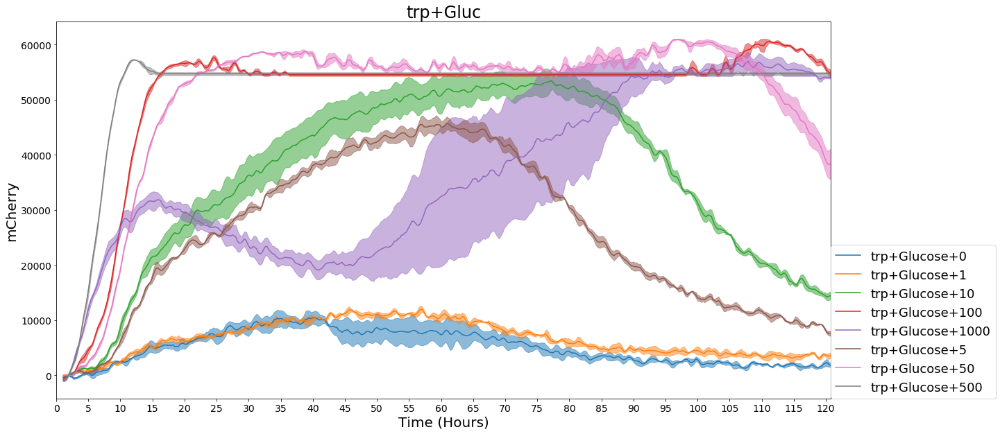

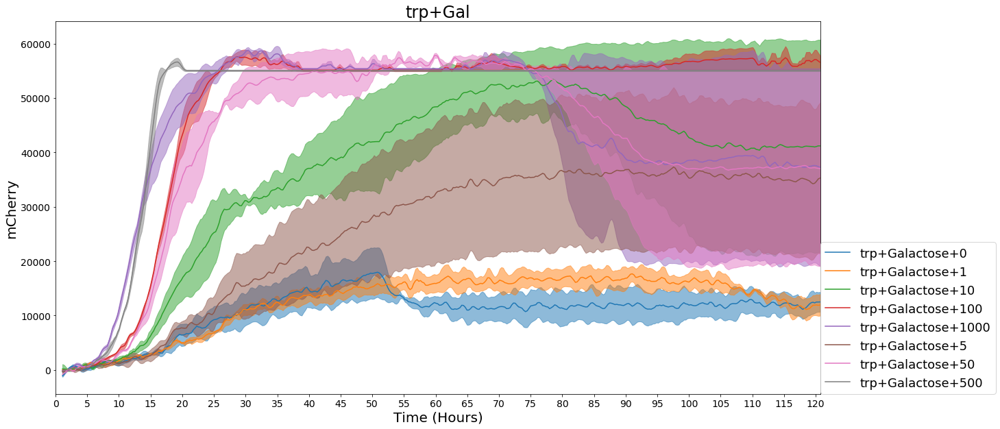

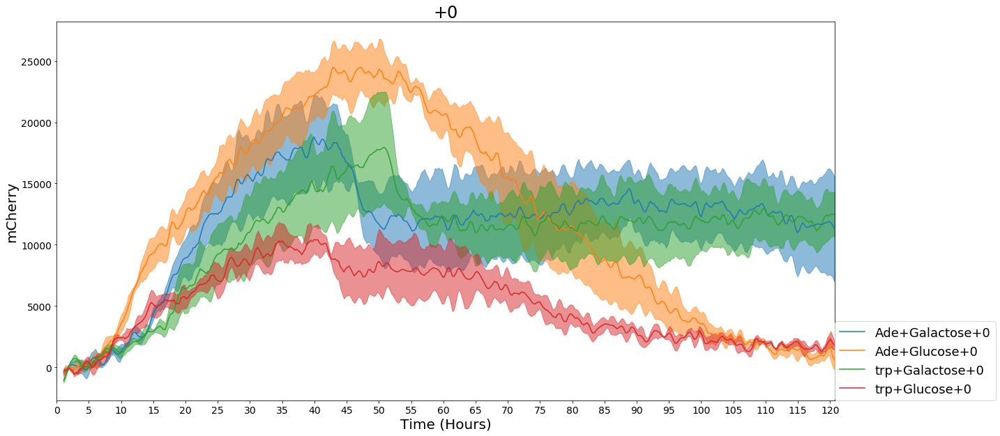

...

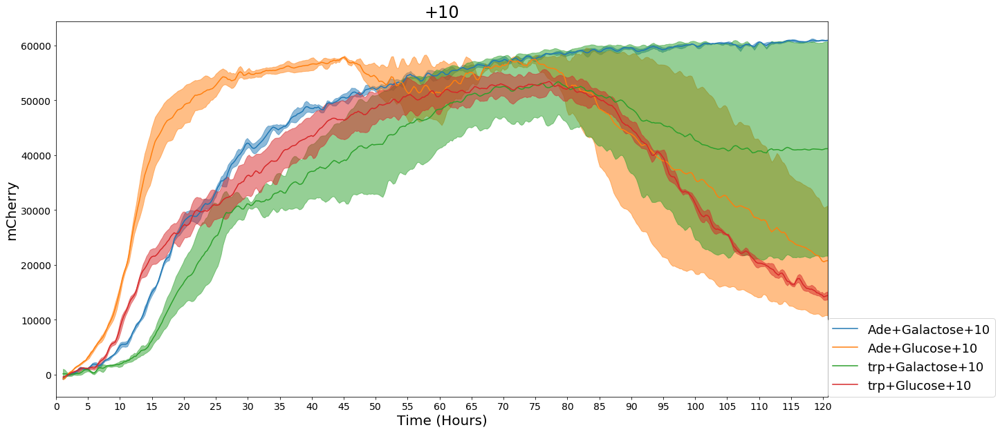

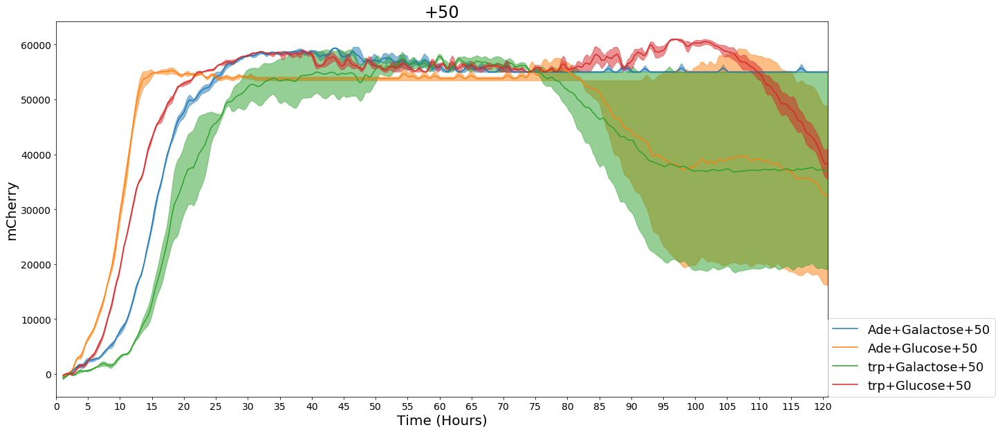

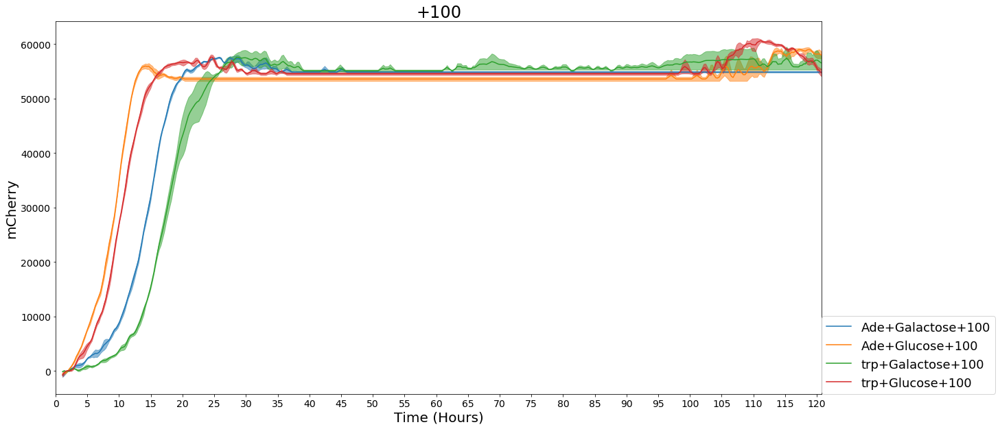

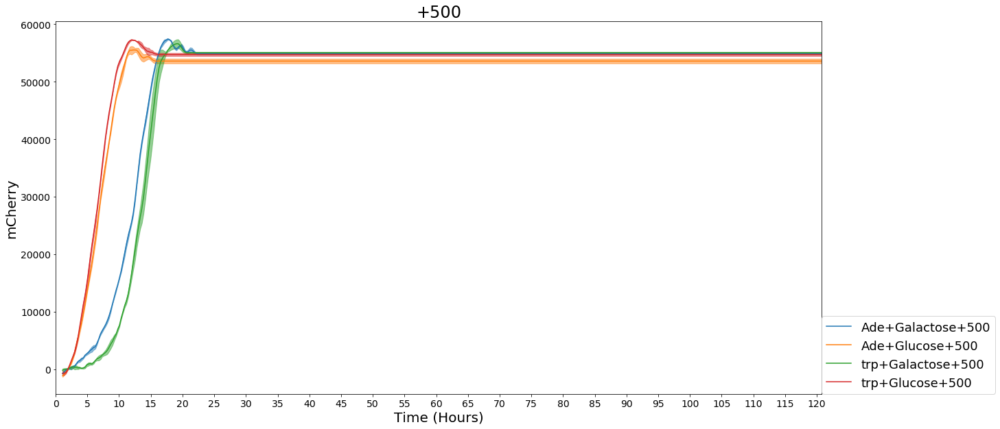

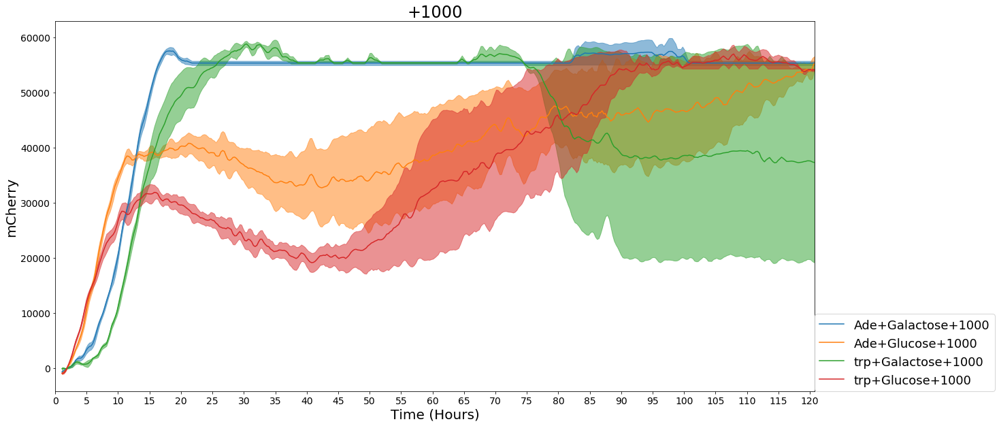

In [43]:
# figure outr what;s going on with means

means = smoothed.mean_by_name(ps)
sems = smoothed.sem_by_name(ps)

mean_OD = means.data_for_label('mCherry')
sems_OD = sems.data_for_label('mCherry')

# groupings of samples for plotting
samples = ['Ade+Gluc','Ade+Gal','trp+Gluc','trp+Gal']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('mCherry', fontsize=20)

plt.show()

# groupings of samples for plotting
samples = ['+0','+1','+5','+10','+50','+100','+500','+1000']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('mCherry', fontsize=20)

plt.show()

In [45]:
red_per_od = smoothed.ratio_time_course('mCherry','abs600')

means = red_per_od.mean_by_name(ps).smoothed()
sems = red_per_od.sem_by_name(ps)

means.labels()

['mCherry/abs600']

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


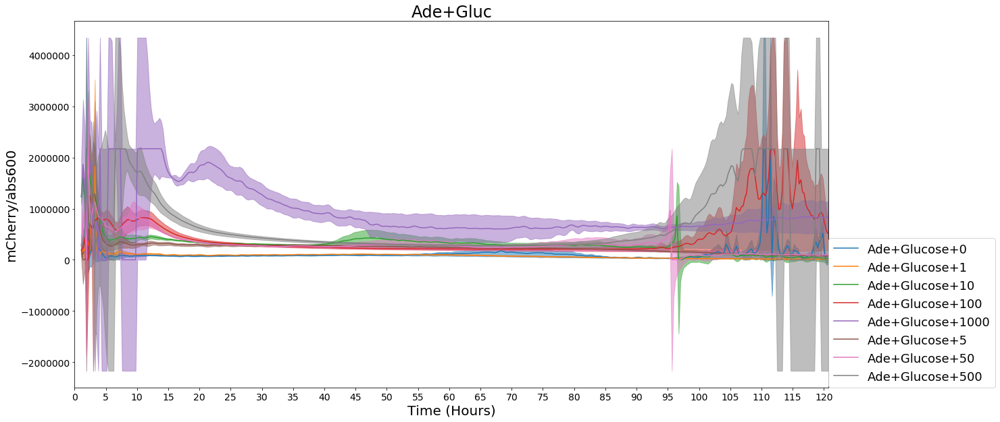

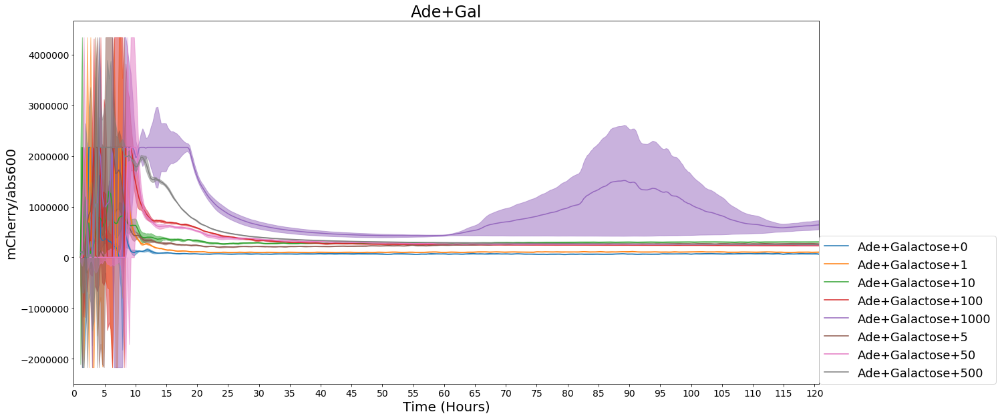

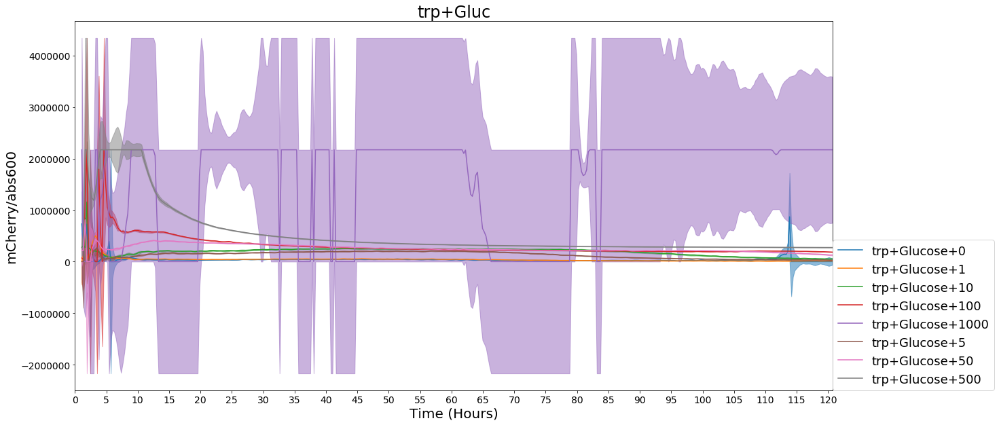

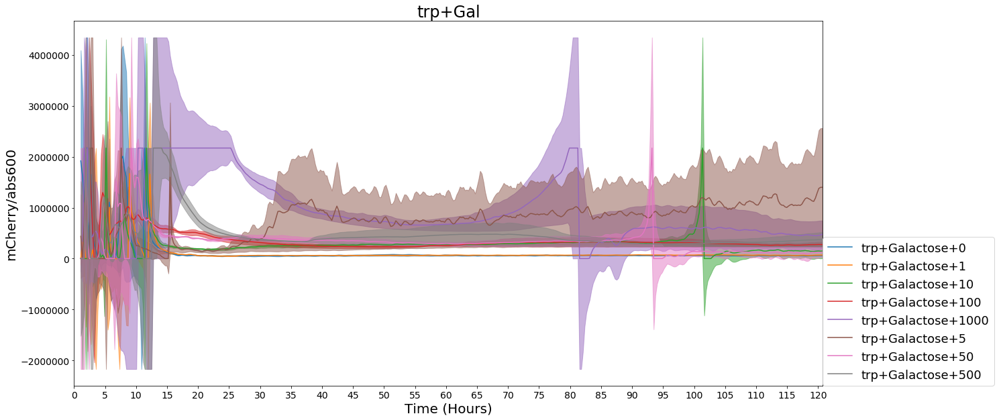

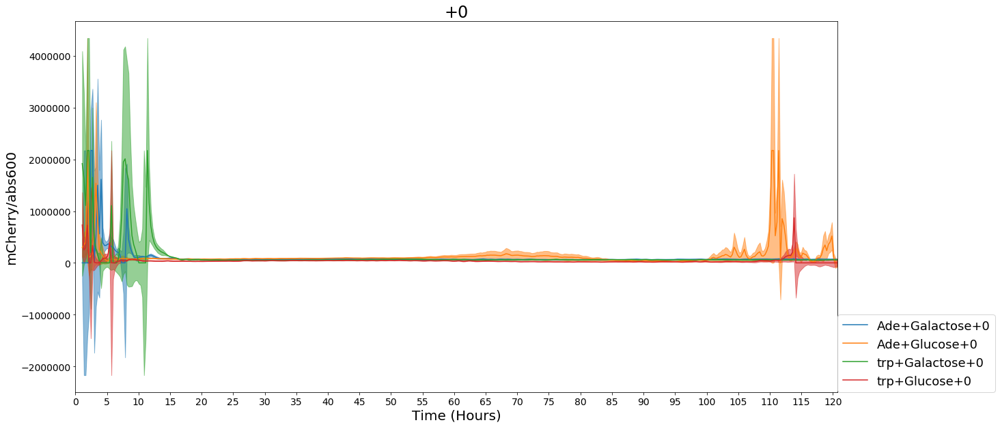

...

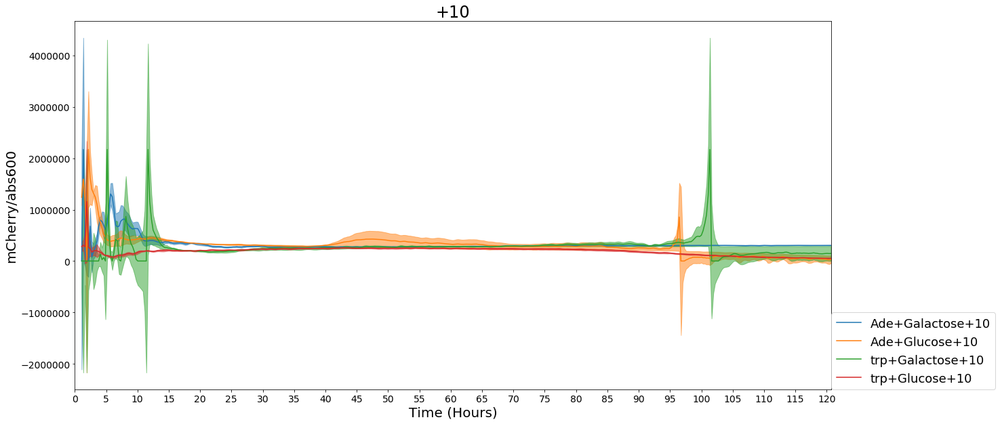

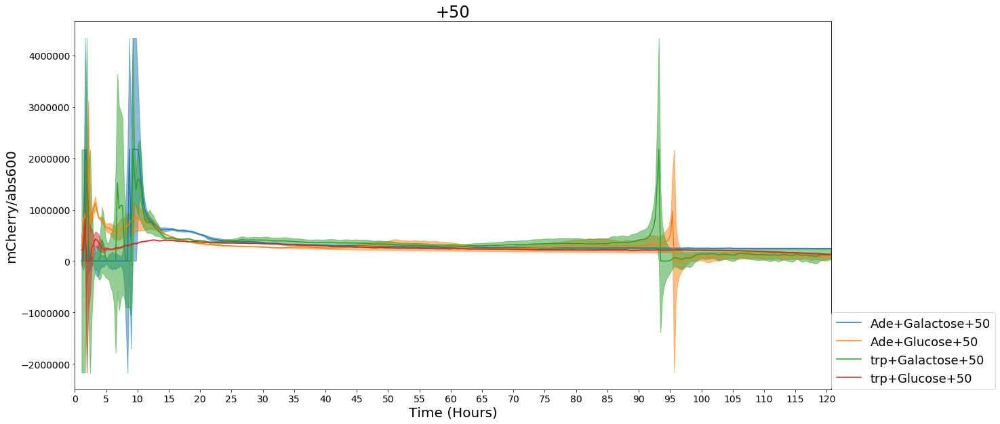

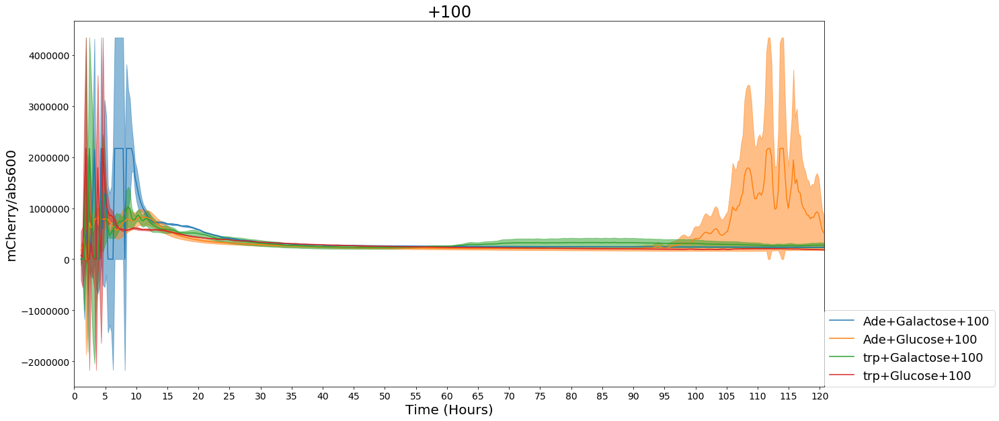

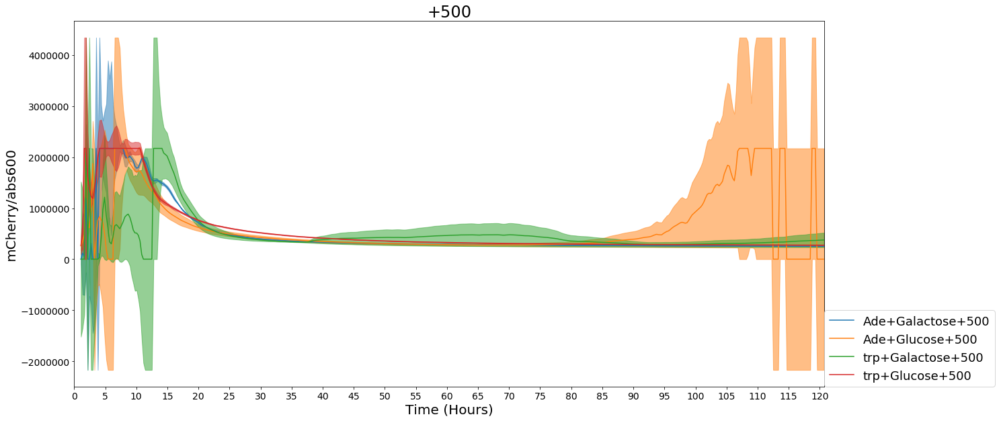

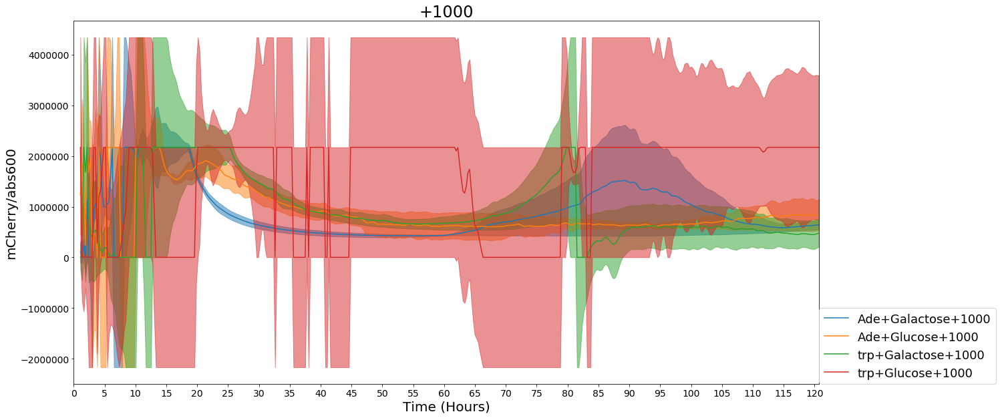

In [48]:
# figure outr what;s going on with means

red_per_od = smoothed.ratio_time_course('mCherry','abs600')

means = red_per_od.mean_by_name(ps)
sems = red_per_od.sem_by_name(ps)

mean_OD = means.data_for_label('mCherry/abs600')
sems_OD = sems.data_for_label('mCherry/abs600')

mean_OD[(mean_OD>5*max(mean_OD.time_s))] = 5*max(mean_OD.time_s)
mean_OD[(mean_OD<0)] = 0


sems_OD[(sems_OD>5*max(sems_OD.time_s))] = 5*max(sems_OD.time_s)
sems_OD[(sems_OD<0)] = 0


# groupings of samples for plotting
samples = ['Ade+Gluc','Ade+Gal','trp+Gluc','trp+Gal']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('mCherry/abs600', fontsize=20)

plt.show()

# groupings of samples for plotting
samples = ['+0','+1','+5','+10','+50','+100','+500','+1000']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('mCherry/abs600', fontsize=20)

plt.show()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


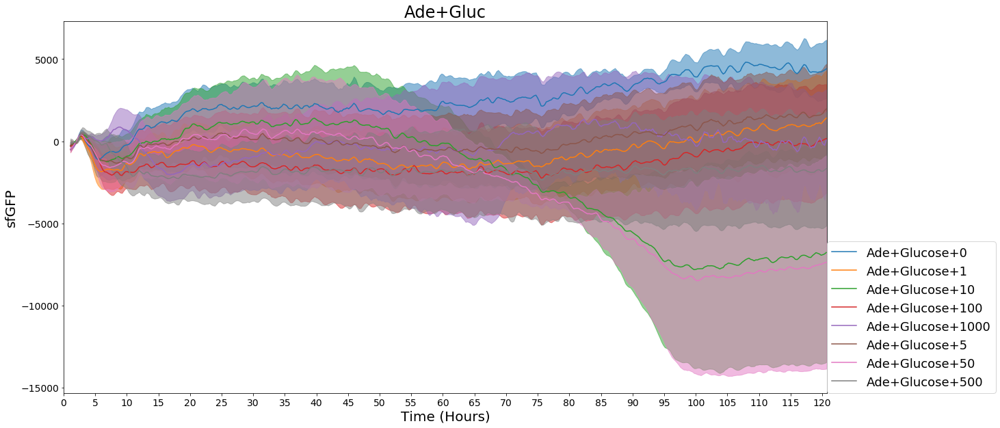

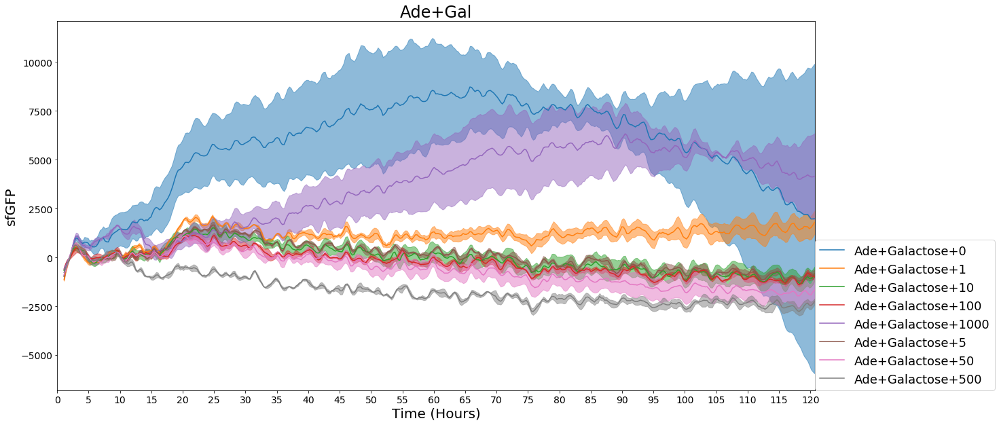

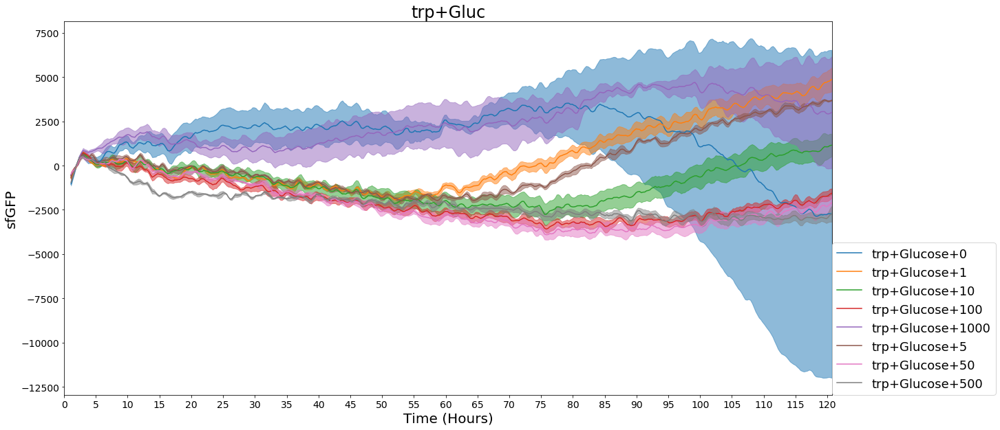

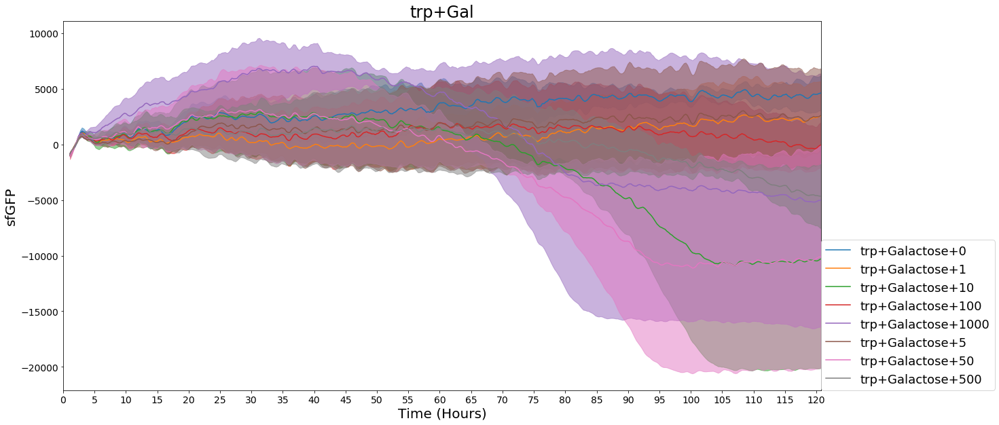

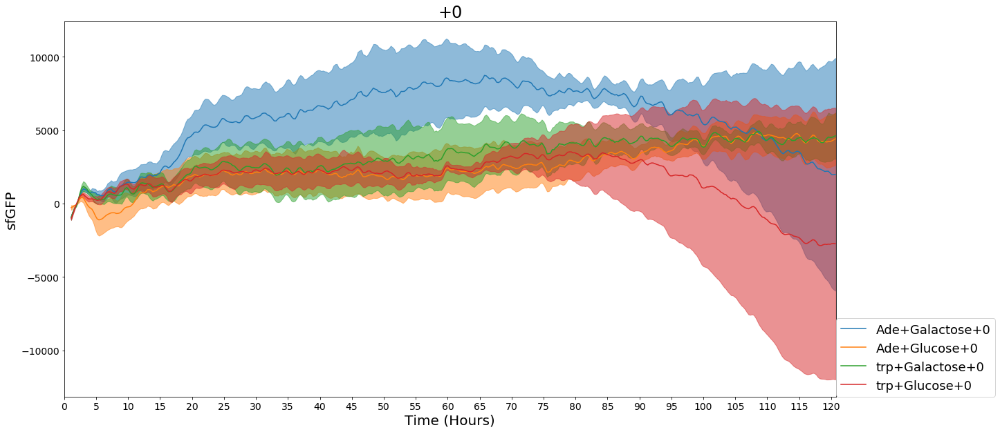

...

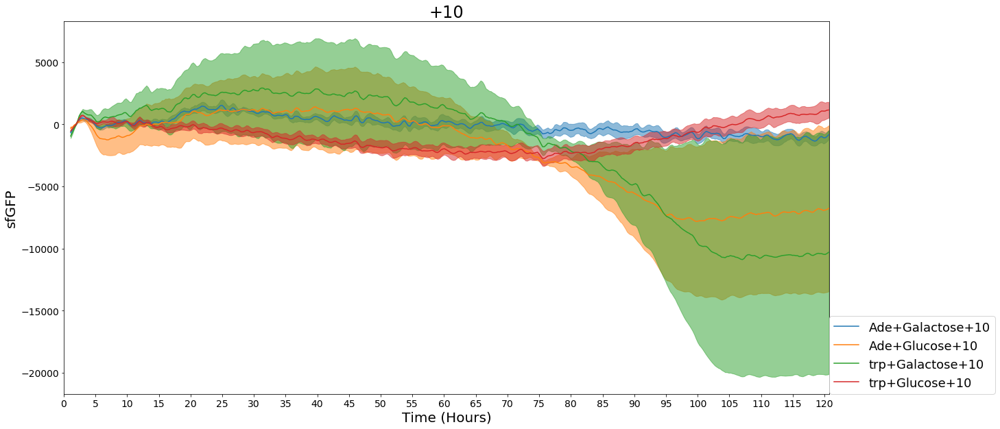

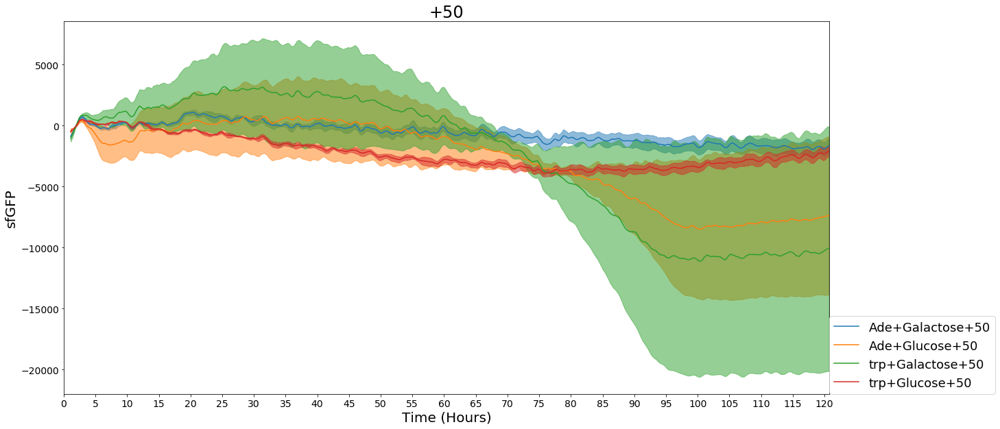

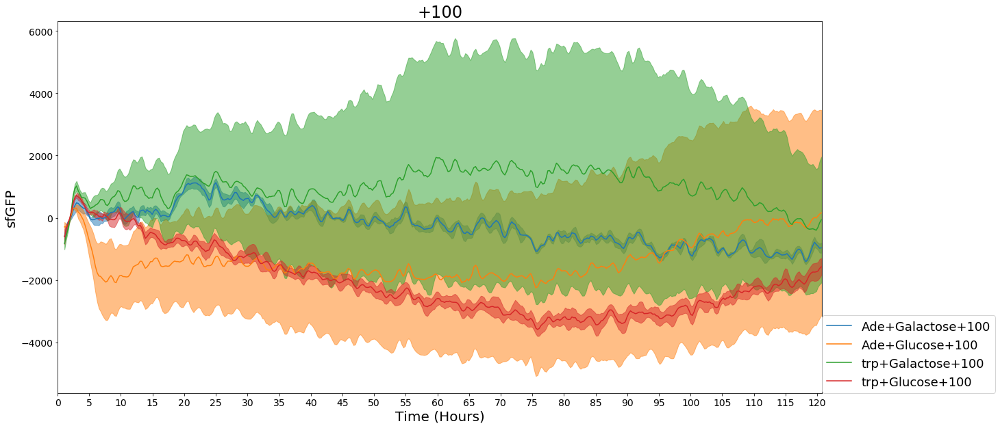

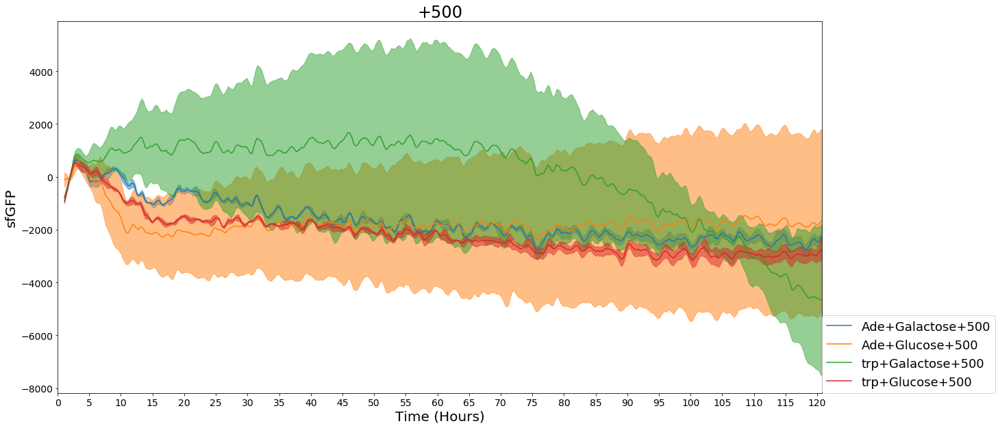

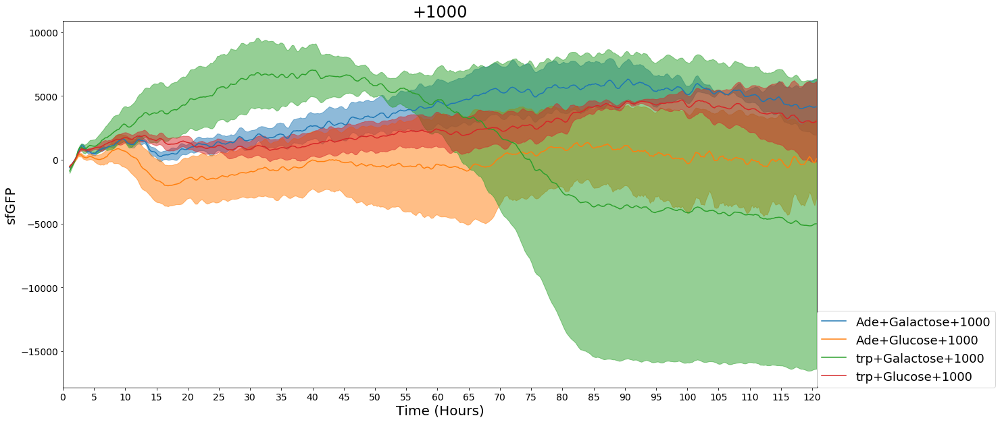

In [49]:
# figure outr what;s going on with means

means = smoothed.mean_by_name(ps)
sems = smoothed.sem_by_name(ps)

mean_OD = means.data_for_label('sfGFP')
sems_OD = sems.data_for_label('sfGFP')

# groupings of samples for plotting
samples = ['Ade+Gluc','Ade+Gal','trp+Gluc','trp+Gal']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('sfGFP', fontsize=20)

plt.show()

# groupings of samples for plotting
samples = ['+0','+1','+5','+10','+50','+100','+500','+1000']

for sample in samples:
    plt.figure(figsize=(20,10))
    time_h = mean_OD.time_s / (60.0*60.0)

    colors = seaborn.color_palette()
    for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
        label = c
        color = colors[i % len(colors)]
        plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                         color=color, alpha=0.5)
        plt.plot(time_h, mean_OD[c], label=label, color=color)


    plt.legend(loc=(1,0), fontsize=18)
    plt.xlim(0, np.max(time_h)+.1)
#     plt.ylim(-0.1, 1.3)
    plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(sample, fontsize=24)
    plt.xlabel('Time (Hours)', fontsize=20)
    plt.ylabel('sfGFP', fontsize=20)

plt.show()